# Loan Status Prediction

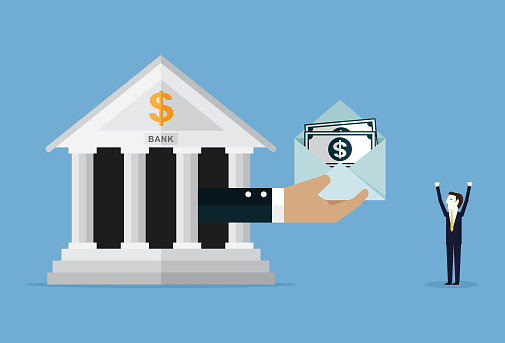

## Changing current working directory

In [1]:
import os
os.chdir(r'C:\Users\Admin\Desktop\python project')
os.getcwd()

'C:\\Users\\Admin\\Desktop\\python project'

In [2]:
import warnings
warnings.filterwarnings('ignore')

# Importing some basic libraries

In [3]:
# Importing the numpy and pandas package
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O 

!pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip
import pandas_profiling

# Data Visualisation
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

  Using cached https://github.com/pandas-profiling/pandas-profiling/archive/master.zip
  Created wheel for pandas-profiling: filename=pandas_profiling-3.0.0-py2.py3-none-any.whl size=248513 sha256=5cdcdd403112a343a27fee1a7f7dc44ad3ffafdd4e9c9bc22a2b930d5f11a83d
  Stored in directory: C:\Users\Public\Documents\Wondershare\CreatorTemp\pip-ephem-wheel-cache-55__hako\wheels\56\c2\dd\8d945b0443c35df7d5f62fa9e9ae105a2d8b286302b92e0109
Successfully built pandas-profiling


In [4]:
# loading csv data to dataframe 
train= pd.read_csv('credit_train.csv',na_values='NA')
test= pd.read_csv('credit_test.csv',na_values='NA')# this a data that we want to predict value of target column for each records of it at the end of the project

In [5]:
type(train['Loan Status'])

pandas.core.series.Series

In [6]:
#concatenate test and train
train['source']='train'# craeting new column and assign a value ('train') to help ourself in future to seprate them 
                       #before modling
test['source']='test'
df = pd.concat([train,test],ignore_index=True, sort=True)
train.shape , test.shape,df.shape

((100514, 20), (10353, 19), (110867, 20))

In [7]:
df.shape

(110867, 20)

In [8]:
#getting number of rows(obs)
df.shape[0]

110867

In [9]:
#getting number of collumns
df.shape[1]

20

In [10]:
#df2=df #copy by refrences
# getting copy of data ( copy by value)
#method1:
df_orginal=df.copy()
#method2:
df_orginal2=df[:]

# EDA(Exploratory Data Analysis)

### Getting fimiliar with data

In [11]:
df.shape

(110867, 20)

In [12]:
# Checking the head of the dataset
df.head()# returns top 5 rows , if you want to get for example top 10 rows df.head(10)

,Annual Income,Bankruptcies,Credit Score,Current Credit Balance,Current Loan Amount,Customer ID,Home Ownership,Loan ID,Loan Status,Maximum Open Credit,Monthly Debt,Months since last delinquent,Number of Credit Problems,Number of Open Accounts,Purpose,Tax Liens,Term,Years in current job,Years of Credit History,source
0,1167493.0,1.0,709.0,228190.0,445412.0,981165ec-3274-42f5-a3b4-d104041a9ca9,Home Mortgage,14dd8831-6af5-400b-83ec-68e61888a048,Fully Paid,416746.0,5214.74,NaN,1.0,6.0,Home Improvements,0.0,Short Term,8 years,17.2,train
1,NaN,0.0,NaN,229976.0,262328.0,2de017a3-2e01-49cb-a581-08169e83be29,Home Mortgage,4771cc26-131a-45db-b5aa-537ea4ba5342,Fully Paid,850784.0,33295.98,8.0,0.0,35.0,Debt Consolidation,0.0,Short Term,10+ years,21.1,train
2,2231892.0,0.0,741.0,297996.0,99999999.0,5efb2b2b-bf11-4dfd-a572-3761a2694725,Own Home,4eed4e6a-aa2f-4c91-8651-ce984ee8fb26,Fully Paid,750090.0,29200.53,29.0,1.0,18.0,Debt Consolidation,0.0,Short Term,8 years,14.9,train
3,806949.0,0.0,721.0,256329.0,347666.0,e777faab-98ae-45af-9a86-7ce5b33b1011,Own Home,77598f7b-32e7-4e3b-a6e5-06ba0d98fe8a,Fully Paid,386958.0,8741.90,NaN,0.0,9.0,Debt Consolidation,0.0,Long Term,3 years,12.0,train
4,NaN,0.0,NaN,253460.0,176220.0,81536ad9-5ccf-4eb8-befb-47a4d608658e,Rent,d4062e70-befa-4995-8643-a0de73938182,Fully Paid,427174.0,20639.70,NaN,0.0,15.0,Debt Consolidation,0.0,Short Term,5 years,6.1,train


In [13]:
df.tail()

,Annual Income,Bankruptcies,Credit Score,Current Credit Balance,Current Loan Amount,Customer ID,Home Ownership,Loan ID,Loan Status,Maximum Open Credit,Monthly Debt,Months since last delinquent,Number of Credit Problems,Number of Open Accounts,Purpose,Tax Liens,Term,Years in current job,Years of Credit History,source
110862,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,test
110863,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,test
110864,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,test
110865,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,test
110866,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,test


## Handling Duplicate Data

In [14]:
df.duplicated().sum(),train.duplicated().sum(),test.duplicated().sum()

(11080, 10728, 352)

In [15]:
df_nodup=df.drop_duplicates()
print(df.shape,df_nodup.shape,'\n Number of duplicate data : ',df.shape[0]-df_nodup.shape[0])

(110867, 20) (99787, 20) 
 Number of duplicate data :  11080


In [16]:
df=df_nodup#replace df with df_nodup

In [17]:
from pandas_profiling import ProfileReport

pandas_profiling extends the pandas DataFrame with df.profile_report() for quick data analysis.

For each column the following statistics - if relevant for the column type - are presented in an interactive HTML report:

Type inference: detect the types of columns in a dataframe. Essentials: type, unique values, missing values Quantile statistics like minimum value, Q1, median, Q3, maximum, range, interquartile range Descriptive statistics like mean, mode, standard deviation, sum, median absolute deviation, coefficient of variation, kurtosis, skewness Most frequent values Histogram Correlations highlighting of highly correlated variables, Spearman, Pearson and Kendall matrices Missing values matrix, count, heatmap and dendrogram of missing values Text analysis learn about categories (Uppercase, Space), scripts (Latin, Cyrillic) and blocks (ASCII) of text data. File and Image analysis extract file sizes, creation dates and dimensions and scan for truncated images or those containing EXIF information.

In [18]:
pandas_profiling.ProfileReport(df)

In [19]:
#Getting data type of varibles
#Method 1
df.dtypes

Annual Income                   float64
Bankruptcies                    float64
Credit Score                    float64
Current Credit Balance          float64
Current Loan Amount             float64
Customer ID                      object
Home Ownership                   object
Loan ID                          object
Loan Status                      object
Maximum Open Credit             float64
Monthly Debt                    float64
Months since last delinquent    float64
Number of Credit Problems       float64
Number of Open Accounts         float64
Purpose                          object
Tax Liens                       float64
Term                             object
Years in current job             object
Years of Credit History         float64
source                           object
dtype: object

In [20]:
#Method 2
#checking  number of obs and columns ,index of columns, name of columns, number of non_null values and datatype, (memory usage,...)
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 99787 entries, 0 to 110514
Data columns (total 20 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Annual Income                 78650 non-null  float64
 1   Bankruptcies                  99573 non-null  float64
 2   Credit Score                  78650 non-null  float64
 3   Current Credit Balance        99785 non-null  float64
 4   Current Loan Amount           99785 non-null  float64
 5   Customer ID                   99785 non-null  object 
 6   Home Ownership                99785 non-null  object 
 7   Loan ID                       99785 non-null  object 
 8   Loan Status                   89785 non-null  object 
 9   Maximum Open Credit           99783 non-null  float64
 10  Monthly Debt                  99785 non-null  float64
 11  Months since last delinquent  46142 non-null  float64
 12  Number of Credit Problems     99785 non-null  float64
 13  

In [21]:
# number of missing values:
#Method 1:
# counting missing values
#df.apply(lambda x: sum(x.isnull())) 
#Python pandas.apply() is a member function in Dataframe class to apply a function along the axis of the Dataframe. 
#or
#df.isnull().sum()
#or
df.isna().sum()
#pandas.DataFrame.isna() vs pandas.DataFrame.isnull():These two DataFrame methods do exactly the same thing! Even their docs are identical. 
 
# Not to confuse with pandas.isnull(), which in contrast to the two above isn't a method of the DataFrame class.    

Annual Income                   21137
Bankruptcies                      214
Credit Score                    21137
Current Credit Balance              2
Current Loan Amount                 2
Customer ID                         2
Home Ownership                      2
Loan ID                             2
Loan Status                     10002
Maximum Open Credit                 4
Monthly Debt                        2
Months since last delinquent    53645
Number of Credit Problems           2
Number of Open Accounts             2
Purpose                             2
Tax Liens                          12
Term                                2
Years in current job             4231
Years of Credit History             2
source                              0
dtype: int64

In [22]:
#method 2:
#calculatin no. of missing values for each column and it's percentage
def percentage_of_miss():
  df1=df[df.columns[df.isnull().sum()>=1]] # I did slicing by condition( I get s subset of dataframe that contains columns that have atleast one missing values) )
  total_miss = df1.isnull().sum().sort_values(ascending=False)
  percent_miss = ((df1.isnull().sum()/df1.isnull().count())*100).sort_values(ascending=False) #df1.isnull().sum() returns only number of missing values,df1.isnull().count() returns whole number of observations (True=1 for null and False=0 for not missing ) 
  missing_data = pd.concat([total_miss, percent_miss], axis=1, keys=['Number of Missing', 'Percentage'])
  return(missing_data)

In [23]:
percentage_of_miss()

,Number of Missing,Percentage
Months since last delinquent,53645,53.759508
Annual Income,21137,21.182118
Credit Score,21137,21.182118
Loan Status,10002,10.023350
Years in current job,4231,4.240031
Bankruptcies,214,0.214457
Tax Liens,12,0.012026
Maximum Open Credit,4,0.004009
Monthly Debt,2,0.002004
Number of Credit Problems,2,0.002004


In [24]:
df.tail(3)

,Annual Income,Bankruptcies,Credit Score,Current Credit Balance,Current Loan Amount,Customer ID,Home Ownership,Loan ID,Loan Status,Maximum Open Credit,Monthly Debt,Months since last delinquent,Number of Credit Problems,Number of Open Accounts,Purpose,Tax Liens,Term,Years in current job,Years of Credit History,source
110512,972097.0,0.0,721.0,184984.0,99999999.0,f90cf410-a34b-49e7-8af9-2b405e17b827,Home Mortgage,0cc8e0e0-1bc6-49d7-ad0f-0598b647458f,NaN,240658.0,12232.20,24.0,1.0,8.0,Debt Consolidation,0.0,Short Term,10+ years,16.8,test
110513,1079960.0,0.0,748.0,179018.0,99999999.0,f1838fa9-7ad9-44d5-97a6-7a6d3f3529d7,Home Mortgage,14f94b64-26c4-48fd-b916-1388d7adcc1d,NaN,607882.0,12239.61,NaN,0.0,14.0,Debt Consolidation,0.0,Short Term,6 years,19.7,test
110514,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,test


##### The last  observations are NaN values and belongs to test data set

In [25]:
#gettin columns' names spicially sometimes there is a space or unders score in some columns' names
df_columns=df.columns
print(df_columns)

Index(['Annual Income', 'Bankruptcies', 'Credit Score',
       'Current Credit Balance', 'Current Loan Amount', 'Customer ID',
       'Home Ownership', 'Loan ID', 'Loan Status', 'Maximum Open Credit',
       'Monthly Debt', 'Months since last delinquent',
       'Number of Credit Problems', 'Number of Open Accounts', 'Purpose',
       'Tax Liens', 'Term', 'Years in current job', 'Years of Credit History',
       'source'],
      dtype='object')


In [26]:
type(df.columns)

pandas.core.indexes.base.Index

#  rename columns assigning new names to df.columns

In [27]:
#categrocial variables
df_cat=df.select_dtypes(include='object')#df.select_dtypes(include=None, exclude=None) Returns a subset of the DataFrame's columns based on the column dtypes
df_cat.columns

Index(['Customer ID', 'Home Ownership', 'Loan ID', 'Loan Status', 'Purpose',
       'Term', 'Years in current job', 'source'],
      dtype='object')

In [28]:
#numerical variables
df_num=df.select_dtypes(exclude='object')# Just get me the numeric variables
df_num.columns

Index(['Annual Income', 'Bankruptcies', 'Credit Score',
       'Current Credit Balance', 'Current Loan Amount', 'Maximum Open Credit',
       'Monthly Debt', 'Months since last delinquent',
       'Number of Credit Problems', 'Number of Open Accounts', 'Tax Liens',
       'Years of Credit History'],
      dtype='object')

### Dropping Irrelevant Feature

In [29]:
#### dropping features are only for identification:
#In this data set I don't have any idea about loan ID and costomer ID i.e. I can not create some more features based on them for example branch number or date of loan 
df.drop(labels=['Loan ID', 'Customer ID'], axis=1, inplace=True)#inplace=True to update df

# Univarate Analysis

### The statistical summary of the dataset

In [30]:
# Getting the summary of Data
pd.options.display.float_format = "{:.2f}".format
df.describe()# for numeric columns

,Annual Income,Bankruptcies,Credit Score,Current Credit Balance,Current Loan Amount,Maximum Open Credit,Monthly Debt,Months since last delinquent,Number of Credit Problems,Number of Open Accounts,Tax Liens,Years of Credit History
count,78650.00,99573.00,78650.00,99785.00,99785.00,99783.00,99785.00,46142.00,99785.00,99785.00,99775.00,99785.00
mean,1375202.26,0.12,1125.44,293703.91,12914871.42,766784.68,18400.19,34.97,0.17,11.12,0.03,18.25
std,1083135.66,0.35,1561.83,373855.19,33132296.89,8371541.25,12170.99,21.97,0.48,5.00,0.26,7.03
min,76627.00,0.00,585.00,0.00,10802.00,0.00,0.00,0.00,0.00,0.00,0.00,3.60
25%,848003.25,0.00,708.00,112423.00,180158.00,276441.00,10162.72,16.00,0.00,8.00,0.00,13.50
50%,1168690.00,0.00,728.00,209551.00,313500.00,471702.00,16133.66,32.00,0.00,10.00,0.00,17.00
75%,1649732.00,0.00,742.00,367061.00,530794.00,791142.00,23913.97,51.00,0.00,14.00,0.00,21.70
max,165557393.00,7.00,7510.00,32878968.00,99999999.00,1539737892.00,435843.28,176.00,15.00,76.00,15.00,70.50


In [31]:
#finding count (number of non_missing values),unique values(or levels), top(mode) and freq(fequency of mode)
#Method 1
df.astype('object').describe()

,Annual Income,Bankruptcies,Credit Score,Current Credit Balance,Current Loan Amount,Home Ownership,Loan Status,Maximum Open Credit,Monthly Debt,Months since last delinquent,Number of Credit Problems,Number of Open Accounts,Purpose,Tax Liens,Term,Years in current job,Years of Credit History,source
count,78650.00,99573.00,78650.00,99785.00,99785.00,99785,89785,99783.00,99785.00,46142.00,99785.00,99785.00,99785,99775.00,99785,95556,99785.00,99787
unique,37853.00,8.00,326.00,33641.00,22502.00,4,2,46468.00,69750.00,116.00,14.00,52.00,16,13.00,2,11,507.00,2
top,1162572.00,0.00,747.00,0.00,99999999.00,Home Mortgage,Fully Paid,0.00,0.00,13.00,0.00,9.00,Debt Consolidation,0.00,Short Term,10+ years,16.00,train
freq,23.00,88775.00,2022.00,581.00,12617.00,48415,67146,690.00,78.00,885.00,86137.00,9330.00,78712,97900.00,73318,30840,1352.00,89786


In [32]:
df.astype('object').describe().transpose()
#or
#df.astype('object').describe().T

,count,unique,top,freq
Annual Income,78650.00,37853.00,1162572.00,23.00
Bankruptcies,99573.00,8.00,0.00,88775.00
Credit Score,78650.00,326.00,747.00,2022.00
Current Credit Balance,99785.00,33641.00,0.00,581.00
Current Loan Amount,99785.00,22502.00,99999999.00,12617.00
Home Ownership,99785,4,Home Mortgage,48415
Loan Status,89785,2,Fully Paid,67146
Maximum Open Credit,99783.00,46468.00,0.00,690.00
Monthly Debt,99785.00,69750.00,0.00,78.00
Months since last delinquent,46142.00,116.00,13.00,885.00


In [33]:
#Method 2
#finding just unique values
df.apply(lambda x: len(x.unique()))

Annual Income                   37854
Bankruptcies                        9
Credit Score                      327
Current Credit Balance          33642
Current Loan Amount             22503
Home Ownership                      5
Loan Status                         3
Maximum Open Credit             46469
Monthly Debt                    69751
Months since last delinquent      117
Number of Credit Problems          15
Number of Open Accounts            53
Purpose                            17
Tax Liens                          14
Term                                3
Years in current job               12
Years of Credit History           508
source                              2
dtype: int64

In [34]:
#Find the Frequency of each items(levels)
#method1
#categrocial variables
df_cat=df.select_dtypes(include='object')
#Exclude ID cols and Source
#df_cat.drop(labels=['Loan_ID', 'Customer_ID'], axis=1, inplace=True)#I excluded Id cols before
df_cat.drop(labels=['source'], axis=1, inplace=True)
df_cat.apply(lambda x:print( x.value_counts()))

Home Mortgage    48415
Rent             42058
Own Home          9113
HaveMortgage       199
Name: Home Ownership, dtype: int64
Fully Paid     67146
Charged Off    22639
Name: Loan Status, dtype: int64
Debt Consolidation      78712
Home Improvements        5830
other                    5796
Other                    3190
Business Loan            1529
Buy a Car                1307
Medical Bills            1096
Buy House                 652
Take a Trip               532
major_purchase            382
small_business            286
moving                    149
wedding                   115
Educational Expenses      105
vacation                   95
renewable_energy            9
Name: Purpose, dtype: int64
Short Term    73318
Long Term     26467
Name: Term, dtype: int64
10+ years    30840
2 years       9170
3 years       8205
< 1 year      8160
5 years       6832
1 year        6480
4 years       6124
6 years       5700
7 years       5543
8 years       4593
9 years       3909
Name: Years in cu

Home Ownership          None
Loan Status             None
Purpose                 None
Term                    None
Years in current job    None
dtype: object

In [35]:
#Method 2
# Filter categorical variables
categorical_columns= {x for x in df.dtypes.index if df.dtypes[x]=='object'}
#or
#categorical_columns= [x for x in df.dtypes.index if df.dtypes[x]=='object']

#exculde Id cols and source:
#categorical_columns= [ x for x in categorical_columns
#                     if x not in ['Loan_ID', 'Customer_ID']]
#Print frequencey of categories
for col in categorical_columns:
    print ('\nFrequency of Categories for varible %s'%col)
    print(df[col].value_counts())


Frequency of Categories for varible Term
Short Term    73318
Long Term     26467
Name: Term, dtype: int64

Frequency of Categories for varible Purpose
Debt Consolidation      78712
Home Improvements        5830
other                    5796
Other                    3190
Business Loan            1529
Buy a Car                1307
Medical Bills            1096
Buy House                 652
Take a Trip               532
major_purchase            382
small_business            286
moving                    149
wedding                   115
Educational Expenses      105
vacation                   95
renewable_energy            9
Name: Purpose, dtype: int64

Frequency of Categories for varible Home Ownership
Home Mortgage    48415
Rent             42058
Own Home          9113
HaveMortgage       199
Name: Home Ownership, dtype: int64

Frequency of Categories for varible source
train    89786
test     10001
Name: source, dtype: int64

Frequency of Categories for varible Years in current job
10

In [36]:
#Method 2
# Filter categorical variables
categorical_columns= {x for x in df.dtypes.index if df.dtypes[x]=='object'}
#or
#categorical_columns= [x for x in df.dtypes.index if df.dtypes[x]=='object']

#exculde Id cols and source:
#categorical_columns= [ x for x in categorical_columns
#                     if x not in ['Loan_ID', 'Customer_ID']]
#Print frequencey of categories
for col in categorical_columns:
    print (f'\nFrequency of Categories for {col} column')
    print(df[col].value_counts())


Frequency of Categories for Term column
Short Term    73318
Long Term     26467
Name: Term, dtype: int64

Frequency of Categories for Purpose column
Debt Consolidation      78712
Home Improvements        5830
other                    5796
Other                    3190
Business Loan            1529
Buy a Car                1307
Medical Bills            1096
Buy House                 652
Take a Trip               532
major_purchase            382
small_business            286
moving                    149
wedding                   115
Educational Expenses      105
vacation                   95
renewable_energy            9
Name: Purpose, dtype: int64

Frequency of Categories for Home Ownership column
Home Mortgage    48415
Rent             42058
Own Home          9113
HaveMortgage       199
Name: Home Ownership, dtype: int64

Frequency of Categories for source column
train    89786
test     10001
Name: source, dtype: int64

Frequency of Categories for Years in current job column
10+ yea

In [37]:
#Method 3
# Filter categorical variables
df_cat=df.select_dtypes(include='object')
#Exclude ID cols and Source
#df_cat.drop(labels=['Loan_ID', 'Customer_ID'], axis=1, inplace=True)#I excluded Id cols before
df_cat.drop(labels=['source'], axis=1, inplace=True)
categorical_columns= df_cat.columns
for col in categorical_columns:
    print ('\nFrequency of Categories for varible %s'%col)#or
                                                              #print (f'\nFrequency of Categories for {col} column')
    print(df[col].value_counts())


Frequency of Categories for varible Home Ownership
Home Mortgage    48415
Rent             42058
Own Home          9113
HaveMortgage       199
Name: Home Ownership, dtype: int64

Frequency of Categories for varible Loan Status
Fully Paid     67146
Charged Off    22639
Name: Loan Status, dtype: int64

Frequency of Categories for varible Purpose
Debt Consolidation      78712
Home Improvements        5830
other                    5796
Other                    3190
Business Loan            1529
Buy a Car                1307
Medical Bills            1096
Buy House                 652
Take a Trip               532
major_purchase            382
small_business            286
moving                    149
wedding                   115
Educational Expenses      105
vacation                   95
renewable_energy            9
Name: Purpose, dtype: int64

Frequency of Categories for varible Term
Short Term    73318
Long Term     26467
Name: Term, dtype: int64

Frequency of Categories for varible Y

# UNIVARIATE AND BIVARIATE ANAYSIS

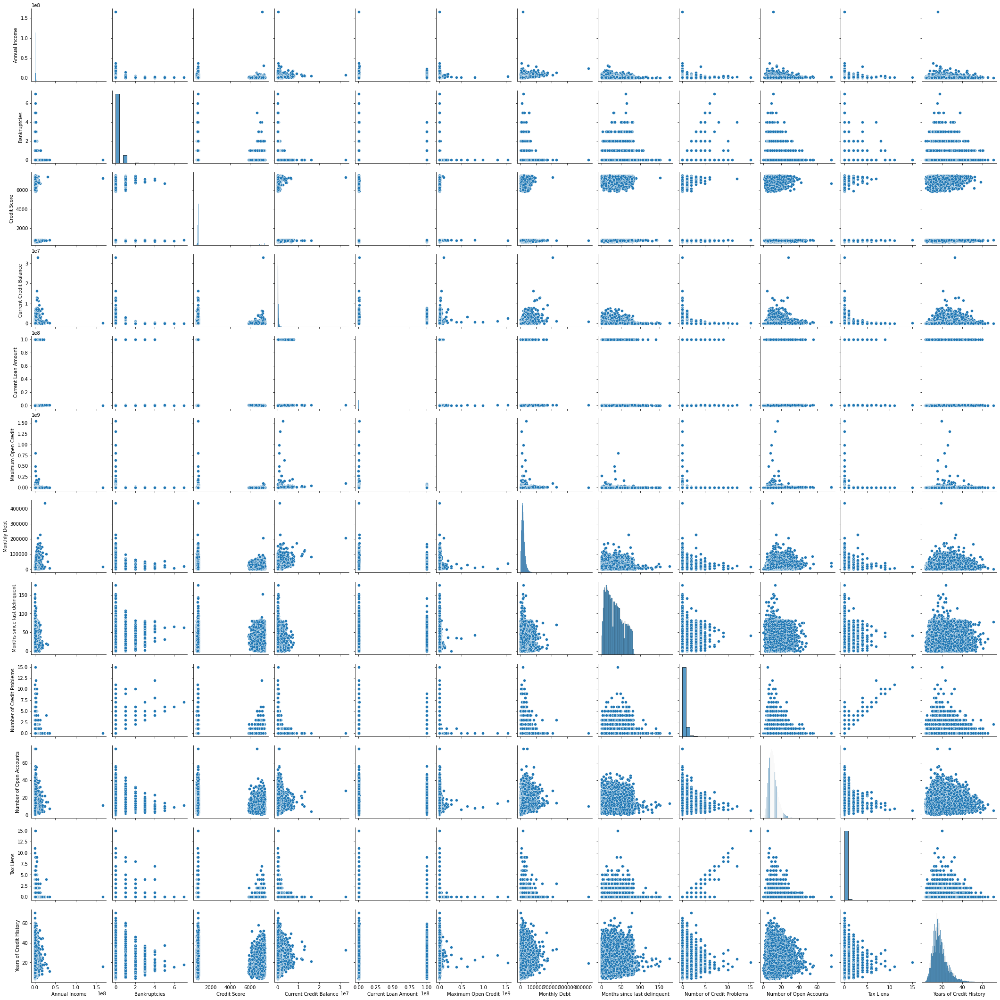

In [38]:
sns.pairplot(df)

# Going through columns one by one

### Target: Loan Status

In [39]:
Loan_Status=df['Loan Status'].value_counts()
Loan_Status

Fully Paid     67146
Charged Off    22639
Name: Loan Status, dtype: int64

Text(0.5, 1, 'Loan Status Counts')

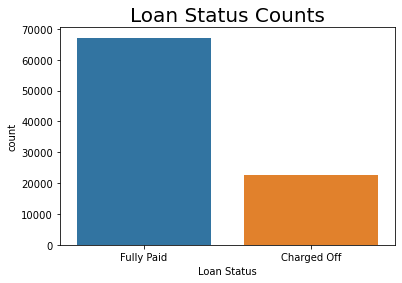

In [40]:
#countplot
sns.countplot(df['Loan Status'])
plt.title("Loan Status Counts", y=1, fontdict={"fontsize": 20})

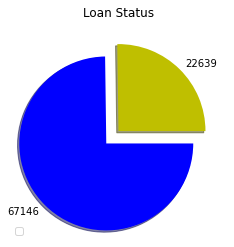

In [41]:
#Pie chart

values = [Loan_Status[0],Loan_Status[1]]
colors = ['b', 'y']
labels = ['Fully Paid','Charged Off']
explode = (0.2, 0)
plt.title('Loan Status')
plt.legend(labels,loc=3)
plt.pie(values, colors=colors, labels= values,explode=explode,
        counterclock=False, shadow=True)

plt.show()

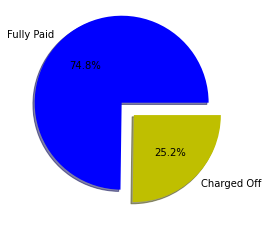

In [42]:
#Percentage
plt.pie(values, colors=colors, labels=labels,
explode=explode, autopct='%1.1f%%', counterclock=True, shadow=True)

plt.show()

### Current Loan Amount

In [43]:
df['Current Loan Amount'].describe()

count      99785.00
mean    12914871.42
std     33132296.89
min        10802.00
25%       180158.00
50%       313500.00
75%       530794.00
max     99999999.00
Name: Current Loan Amount, dtype: float64

<AxesSubplot:ylabel='Current Loan Amount'>

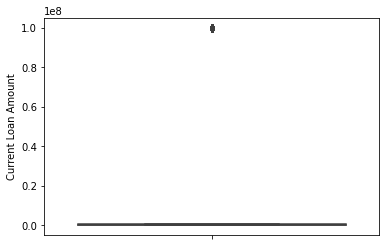

In [44]:
sns.boxplot( y=df['Current Loan Amount'] )

In [45]:
#lower inner fence: Q1 - 1.5*IQR
#upper inner fence: Q3 + 1.5*IQR
def outlier_analysis(col):
    Q1=df[col].quantile(0.25)
    Q3=df[col].quantile(0.75)
    IQR=Q3-Q1
    UIF=Q3+1.5*(IQR)
    LIF=Q1-1.5*(IQR)
    df_out =df[(df[col]<LIF) | (df[col]>UIF)] # I created a new data set that has just include potential outliers
    sns.distplot(df_out[col])#Plotting univariate distributions.By default, this will draw a histogram and fit a kernel density estimate (KDE)
   
    return df_out[col] .describe()

count      12617.00
mean    99999999.00
std            0.00
min     99999999.00
25%     99999999.00
50%     99999999.00
75%     99999999.00
max     99999999.00
Name: Current Loan Amount, dtype: float64

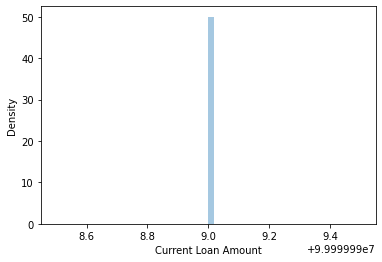

In [46]:
outlier_analysis('Current Loan Amount')

In [47]:
df['Current Loan Amount']=df['Current Loan Amount'].replace(99999999, np.NaN)

In [48]:
df['Current Loan Amount'].describe()

count    87168.00
mean    309866.66
std     184229.21
min      10802.00
25%     172150.00
50%     266222.00
75%     430892.00
max     789250.00
Name: Current Loan Amount, dtype: float64

<AxesSubplot:ylabel='Current Loan Amount'>

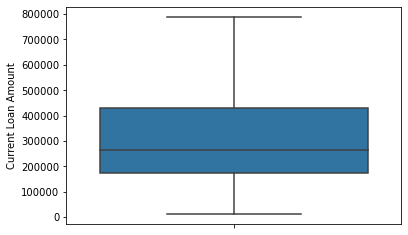

In [49]:
sns.boxplot( y=df['Current Loan Amount'] )

<AxesSubplot:xlabel='Current Loan Amount', ylabel='Density'>

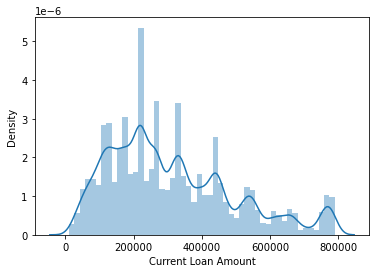

In [50]:
sns.distplot(df['Current Loan Amount'])

# Term

In [51]:
df['Term'].value_counts()

Short Term    73318
Long Term     26467
Name: Term, dtype: int64

Text(0.5, 1, 'Term')

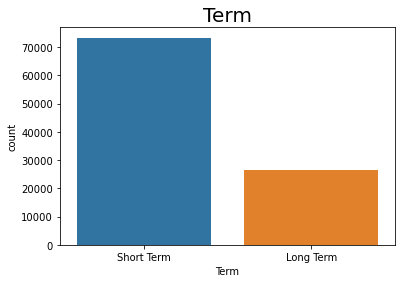

In [52]:
#countplot
sns.countplot(df['Term'])
plt.title("Term", y=1, fontdict={"fontsize": 20})

([<matplotlib.patches.Wedge at 0x273482e7208>,
 [Text(-0.8741902878270721, 0.9621805135570046, 'Short Term'),
  Text(0.7396994743152143, -0.8141527422405428, 'Long Term')],
 [Text(-0.537963254047429, 0.5921110852658489, '73.5%'),
  Text(0.4034724405355714, -0.44408331394938694, '26.5%')])

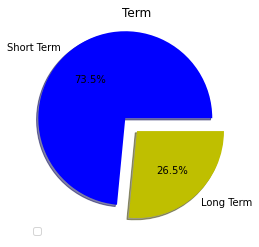

In [53]:
Term=df['Term'].value_counts()
values = [Term[0],Term[1]]
colors = ['b', 'y']
labels = ['Short Term','Long Term']
explode = (0.2, 0)
plt.title('Term')
plt.legend(labels,loc=3)
plt.pie(values, colors=colors, labels=labels,
explode=explode, autopct='%1.1f%%', counterclock=True, shadow=True)

## Bivariate Analysis for Loan Status Vs. Term

In [54]:
contingency_table1 = pd.crosstab(df['Term'],df['Loan Status'],margins = True)
contingency_table1

Loan Status,Charged Off,Fully Paid,All
Term,,,
Long Term,8366,15396,23762
Short Term,14273,51750,66023
All,22639,67146,89785


## Chi-squared test of independence

In [55]:

from scipy.stats import chi2_contingency
def chi_square(c1,c2):
    chi_2, p_val, dof, exp_val = chi2_contingency(pd.crosstab(df[c1],df[c2],margins = False))# make sure margins = False

    print(exp_val)
    #print('\nChi-square is : %f'%chi_2, '\n\np_value is : %f'%p_val, '\n\ndegree of freedom is : %i'%dof)
    print(f'\nChi-square is : {chi_2}', f'\n\np_value is : {p_val}', f'\n\ndegree of freedom is :{dof}')

    if p_val < 0.05:# consider significan level is 5%
        print("\nThere is some correlation between the two variables at 0.05 significant level")
    else:
        print("\nThere is no correlation between the two variables")

In [56]:
chi_square("Term",'Loan Status')

[[ 5991.51214568 17770.48785432]
 [16647.48785432 49375.51214568]]

Chi-square is : 1710.4591830443744 

p_value is : 0.0 

degree of freedom is :1

There is some correlation between the two variables at 0.05 significant level


## Credit Score

In [57]:
df['Credit Score'].describe()

count   78650.00
mean     1125.44
std      1561.83
min       585.00
25%       708.00
50%       728.00
75%       742.00
max      7510.00
Name: Credit Score, dtype: float64

We know that credit score is between 350 and 850 so having max=7510 is impossible. let's take a look to outliers closer

count   8005.00
mean    4681.85
std     3143.54
min      585.00
25%      647.00
50%     6880.00
75%     7260.00
max     7510.00
Name: Credit Score, dtype: float64

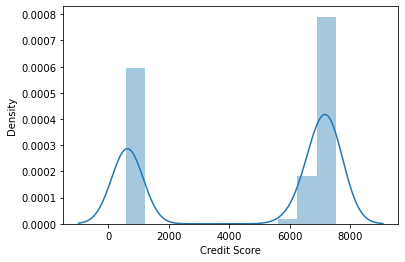

In [58]:
outlier_analysis('Credit Score')

<AxesSubplot:xlabel='Credit Score'>

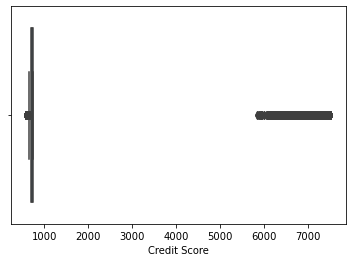

In [59]:
sns.boxplot(x=df['Credit Score'])

In [60]:
dfc =df[df['Credit Score']>850] 
dfc['Credit Score'].describe()

count   5004.00
mean    7108.86
std      306.27
min     5850.00
25%     6950.00
50%     7190.00
75%     7350.00
max     7510.00
Name: Credit Score, dtype: float64

#It looks like some of the credit score are just scaled up by 10, let me check it and after that I will fix it.

In [61]:
len(dfc[dfc['Credit Score']%10==0])

5004

### Annual Income

In [62]:
df['Annual Income'].describe()

count       78650.00
mean      1375202.26
std       1083135.66
min         76627.00
25%        848003.25
50%       1168690.00
75%       1649732.00
max     165557393.00
Name: Annual Income, dtype: float64

<AxesSubplot:xlabel='Annual Income'>

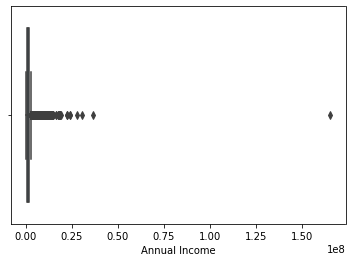

In [63]:
sns.boxplot(x=df['Annual Income'])

count        3663.00
mean      4143542.80
std       3339461.55
min       2852565.00
25%       3089865.50
50%       3491269.00
75%       4301248.50
max     165557393.00
Name: Annual Income, dtype: float64

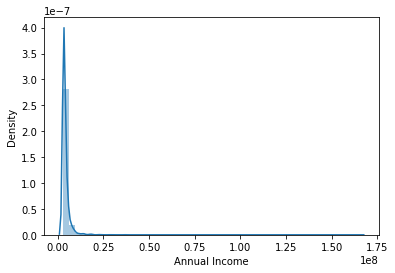

In [64]:
outlier_analysis('Annual Income')

In [65]:
dfc =df[df['Annual Income']>100000000] 
dfc['Annual Income'].describe()

count           1.00
mean    165557393.00
std              nan
min     165557393.00
25%     165557393.00
50%     165557393.00
75%     165557393.00
max     165557393.00
Name: Annual Income, dtype: float64

In [66]:
dfc =df[df['Annual Income']>4000000] 
dfc['Annual Income'].describe()

count        1123.00
mean      6073056.49
std       5547376.21
min       4001666.00
25%       4430344.00
50%       4952350.00
75%       6230518.00
max     165557393.00
Name: Annual Income, dtype: float64

### Years in current job

In [67]:
df['Years in current job'].value_counts()

10+ years    30840
2 years       9170
3 years       8205
< 1 year      8160
5 years       6832
1 year        6480
4 years       6124
6 years       5700
7 years       5543
8 years       4593
9 years       3909
Name: Years in current job, dtype: int64

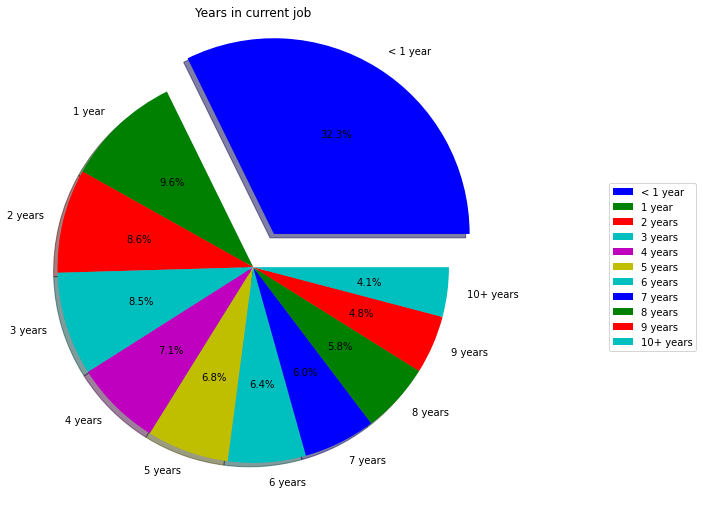

In [68]:
#Pie chart
plt.figure(figsize=(9,9))
years=df['Years in current job'].value_counts()
values = [years[0], years[1], years[2],years[3], years[4], years[5],years[6],years[7], years[8],years[9], years[10]]
colors = ['b', 'g', 'r', 'c', 'm', 'y','c','b', 'g', 'r', 'c']
labels = ['< 1 year','1 year','2 years','3 years','4 years','5 years','6 years','7 years','8 years','9 years','10+ years']
explode = (.2, 0, 0, 0, 0, 0,0,0,0,0,0)
plt.pie(values, colors=colors, labels=labels,explode=explode, autopct='%1.1f%%', counterclock=True, shadow=True)
plt.title('Years in current job')
plt.legend(labels,loc=6,borderaxespad=60)

plt.show()

### Years in current job Vs. Loan Status

In [69]:
contingency_table2= pd.crosstab(df['Loan Status'],df['Years in current job'],margins = True)
contingency_table2

Years in current job,1 year,10+ years,2 years,3 years,4 years,5 years,6 years,7 years,8 years,9 years,< 1 year,All
Loan Status,,,,,,,,,,,,
Charged Off,1493,6724,2002,1730,1376,1532,1320,1289,1051,942,1908,21367
Fully Paid,4339,21031,6252,5609,4135,4604,3814,3700,3070,2605,5457,64616
All,5832,27755,8254,7339,5511,6136,5134,4989,4121,3547,7365,85983


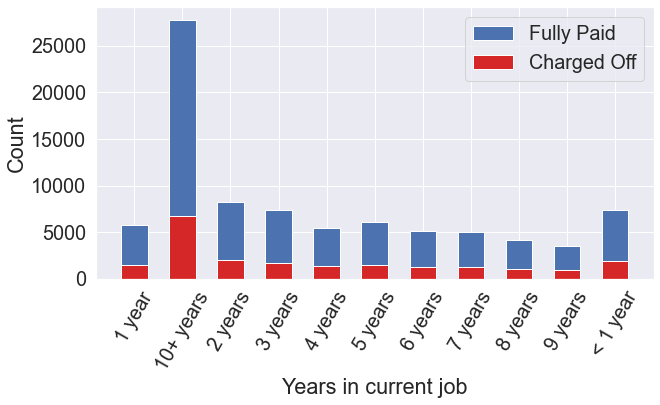

In [70]:
#Assigns the frequency values
ChargedOff = contingency_table2.iloc[0][0:11].values
FullyPaid = contingency_table2.iloc[1][0:11].values

#Plots the bar chart
fig = plt.figure(figsize=(10, 5))
sns.set(font_scale=1.8)
categories = ["1 year","10+ years","2 years","3 years","4 years","5 years","6 years","7 years",
              "8 years","9 years","< 1 year"]
p1 = plt.bar(categories, ChargedOff, 0.55, color='#d62728')
p2 = plt.bar(categories, FullyPaid, 0.55, bottom=ChargedOff)
plt.legend((p2[0], p1[0]), ('Fully Paid', 'Charged Off'))
plt.xlabel('Years in current job')
plt.xticks(rotation=60)
plt.ylabel('Count')
plt.show()

In [71]:
chi_square("Years in current job",'Loan Status')

[[ 1449.26722724  4382.73277276]
 [ 6897.18996778 20857.81003222]
 [ 2051.14055104  6202.85944896]
 [ 1823.76066199  5515.23933801]
 [ 1369.49788912  4141.50211088]
 [ 1524.81202098  4611.18797902]
 [ 1275.81240478  3858.18759522]
 [ 1239.77952619  3749.22047381]
 [ 1024.07925985  3096.92074015]
 [  881.43876115  2665.56123885]
 [ 1830.22172988  5534.77827012]]

Chi-square is : 31.123702389310598 

p_value is : 0.0005597500797855206 

degree of freedom is :10

There is some correlation between the two variables at 0.05 significant level


In [72]:
HL=df.groupby(['Years in current job']).agg({'Annual Income':np.mean})
HL

,Annual Income
Years in current job,
1 year,1290271.03
10+ years,1513822.27
2 years,1346066.06
3 years,1330352.34
4 years,1327670.15
5 years,1337205.89
6 years,1347156.85
7 years,1392009.60
8 years,1394145.92


## Home Ownership

In [73]:
df['Home Ownership'].value_counts()

Home Mortgage    48415
Rent             42058
Own Home          9113
HaveMortgage       199
Name: Home Ownership, dtype: int64

#I will replace 'HaveMortgage' with 'Home Mortgage' in feature engineering part

## Purpose

In [74]:
df['Purpose'].value_counts()

Debt Consolidation      78712
Home Improvements        5830
other                    5796
Other                    3190
Business Loan            1529
Buy a Car                1307
Medical Bills            1096
Buy House                 652
Take a Trip               532
major_purchase            382
small_business            286
moving                    149
wedding                   115
Educational Expenses      105
vacation                   95
renewable_energy            9
Name: Purpose, dtype: int64

### there is other and Other in Purpose of loan so I will convert Other to other.

In [75]:
# we have other and Other in 'Purpose'
df['Purpose']=df['Purpose'].replace('Other', 'other')
#method2: df['Purpose'] = df['Purpose'].str.lower()

In [76]:
df['Purpose'].value_counts()

Debt Consolidation      78712
other                    8986
Home Improvements        5830
Business Loan            1529
Buy a Car                1307
Medical Bills            1096
Buy House                 652
Take a Trip               532
major_purchase            382
small_business            286
moving                    149
wedding                   115
Educational Expenses      105
vacation                   95
renewable_energy            9
Name: Purpose, dtype: int64

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14]),
 [Text(0, 0, 'Home Improvements'),
  Text(1, 0, 'Debt Consolidation'),
  Text(2, 0, 'Buy House'),
  Text(3, 0, 'other'),
  Text(4, 0, 'Business Loan'),
  Text(5, 0, 'Buy a Car'),
  Text(6, 0, 'major_purchase'),
  Text(7, 0, 'Take a Trip'),
  Text(8, 0, 'small_business'),
  Text(9, 0, 'Medical Bills'),
  Text(10, 0, 'wedding'),
  Text(11, 0, 'vacation'),
  Text(12, 0, 'Educational Expenses'),
  Text(13, 0, 'moving'),
  Text(14, 0, 'renewable_energy')])

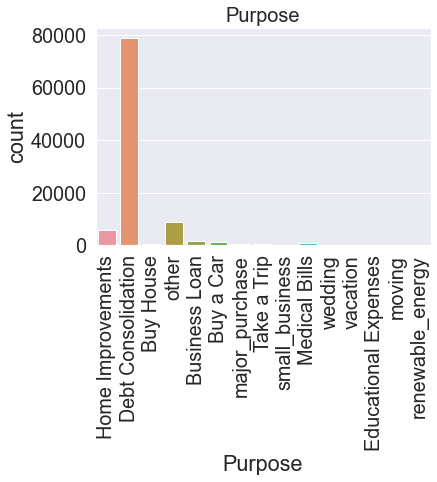

In [77]:
sns.countplot(df['Purpose'])
plt.title("Purpose", y=1, fontdict={"fontsize": 20})
plt.xticks(rotation=90)

## Purpose Vs. Loan Status

In [78]:
contigency_table= pd.crosstab(df['Purpose'],df['Loan Status'])
contigency_table

Loan Status,Charged Off,Fully Paid
Purpose,,
Business Loan,478,888
Buy House,140,442
Buy a Car,203,962
Debt Consolidation,17918,52916
Educational Expenses,18,73
Home Improvements,1163,4074
Medical Bills,278,705
Take a Trip,115,373
major_purchase,82,248


In [79]:
chi_square("Purpose",'Loan Status')

[[3.44432522e+02 1.02156748e+03]
 [1.46749435e+02 4.35250565e+02]
 [2.93751016e+02 8.71248984e+02]
 [1.78605661e+04 5.29734339e+04]
 [2.29453584e+01 6.80546416e+01]
 [1.32049277e+03 3.91650723e+03]
 [2.47860300e+02 7.35139700e+02]
 [1.23047636e+02 3.64952364e+02]
 [8.32084424e+01 2.46791558e+02]
 [3.40398173e+01 1.00960183e+02]
 [2.04667554e+03 6.07032446e+03]
 [2.01717436e+00 5.98282564e+00]
 [6.42974328e+01 1.90702567e+02]
 [2.24410648e+01 6.65589352e+01]
 [2.64754135e+01 7.85245865e+01]]

Chi-square is : 211.02475802788453 

p_value is : 3.0493880395367606e-37 

degree of freedom is :14

There is some correlation between the two variables at 0.05 significant level


In [80]:
df['Purpose']=df['Purpose'].replace('renewable_energy', 'other')

In [81]:
df['Purpose']=df['Purpose'].replace('Take a Trip', 'vacation')

In [82]:
contigency_table= pd.crosstab(df['Purpose'],df['Loan Status'])
contigency_table

Loan Status,Charged Off,Fully Paid
Purpose,,
Business Loan,478,888
Buy House,140,442
Buy a Car,203,962
Debt Consolidation,17918,52916
Educational Expenses,18,73
Home Improvements,1163,4074
Medical Bills,278,705
major_purchase,82,248
moving,43,92


In [83]:
chi_square("Purpose",'Loan Status')

[[3.44432522e+02 1.02156748e+03]
 [1.46749435e+02 4.35250565e+02]
 [2.93751016e+02 8.71248984e+02]
 [1.78605661e+04 5.29734339e+04]
 [2.29453584e+01 6.80546416e+01]
 [1.32049277e+03 3.91650723e+03]
 [2.47860300e+02 7.35139700e+02]
 [8.32084424e+01 2.46791558e+02]
 [3.40398173e+01 1.00960183e+02]
 [2.04869271e+03 6.07630729e+03]
 [6.42974328e+01 1.90702567e+02]
 [1.45488701e+02 4.31511299e+02]
 [2.64754135e+01 7.85245865e+01]]

Chi-square is : 205.12055352039422 

p_value is : 2.856506713382526e-37 

degree of freedom is :12

There is some correlation between the two variables at 0.05 significant level


### Monthly Debt

In [84]:
df['Monthly Debt'].describe()

count    99785.00
mean     18400.19
std      12170.99
min          0.00
25%      10162.72
50%      16133.66
75%      23913.97
max     435843.28
Name: Monthly Debt, dtype: float64

<AxesSubplot:xlabel='Monthly Debt'>

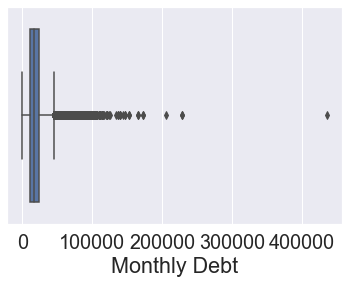

In [85]:
sns.boxplot(x=df['Monthly Debt'])

count     3393.00
mean     57214.88
std      16133.50
min      44547.59
25%      47923.70
50%      52599.22
75%      60885.12
max     435843.28
Name: Monthly Debt, dtype: float64

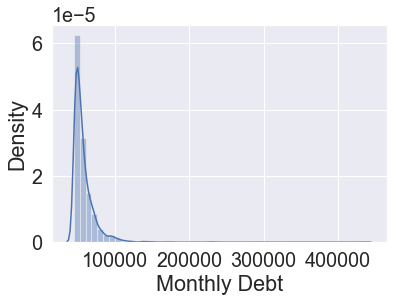

In [86]:
outlier_analysis('Monthly Debt')

### Years of Credit History

In [87]:
df['Years of Credit History'].describe()

count   99785.00
mean       18.25
std         7.03
min         3.60
25%        13.50
50%        17.00
75%        21.70
max        70.50
Name: Years of Credit History, dtype: float64

In [88]:
df['Years of Credit History'].value_counts()

16.00    1352
15.00    1307
17.00    1216
16.50    1168
14.00    1161
         ... 
56.00       1
49.70       1
58.00       1
49.80       1
59.70       1
Name: Years of Credit History, Length: 507, dtype: int64

## Years of Credit History Vs. Loan Status

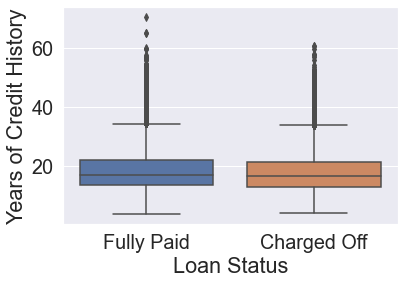

In [89]:
ax = sns.boxplot(x='Loan Status', y='Years of Credit History', data=df)

In [90]:
df.groupby(['Loan Status']).agg({'Years of Credit History':np.mean})

,Years of Credit History
Loan Status,
Charged Off,17.89
Fully Paid,18.37


### Months since last delinquent

In [91]:
df['Months since last delinquent'].describe()

count   46142.00
mean       34.97
std        21.97
min         0.00
25%        16.00
50%        32.00
75%        51.00
max       176.00
Name: Months since last delinquent, dtype: float64

In [92]:
df['Months since last delinquent'].value_counts()

13.00     885
12.00     873
15.00     865
9.00      857
8.00      838
         ... 
130.00      1
176.00      1
141.00      1
148.00      1
118.00      1
Name: Months since last delinquent, Length: 116, dtype: int64

### Months since last delinquent Vs. Loan Status

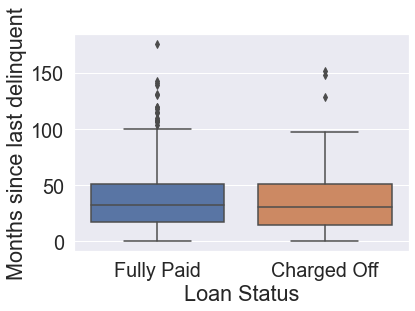

In [93]:
ax = sns.boxplot(x='Loan Status', y='Months since last delinquent', data=df)

In [94]:
df.groupby(['Loan Status']).agg({'Months since last delinquent':np.mean})

,Months since last delinquent
Loan Status,
Charged Off,34.34
Fully Paid,35.19


### Number of Open Accounts

In [95]:
df['Number of Open Accounts'].describe()


count   99785.00
mean       11.12
std         5.00
min         0.00
25%         8.00
50%        10.00
75%        14.00
max        76.00
Name: Number of Open Accounts, dtype: float64

In [96]:
df['Number of Open Accounts'].value_counts()

9.00     9330
10.00    9076
8.00     8846
11.00    8549
7.00     8173
12.00    7398
6.00     6787
13.00    6168
14.00    5160
5.00     4700
15.00    4252
16.00    3508
17.00    2855
4.00     2836
18.00    2194
19.00    1890
20.00    1421
3.00     1320
21.00    1107
22.00     835
23.00     679
24.00     549
2.00      427
25.00     415
26.00     265
27.00     254
28.00     167
29.00     120
30.00     108
31.00      72
32.00      66
33.00      51
34.00      38
36.00      28
35.00      25
1.00       24
37.00      17
38.00      12
43.00      10
39.00       9
40.00       8
41.00       7
45.00       5
42.00       5
47.00       5
44.00       3
56.00       2
52.00       2
48.00       2
0.00        2
76.00       2
55.00       1
Name: Number of Open Accounts, dtype: int64

count   2248.00
mean      27.44
std        4.38
min       24.00
25%       25.00
50%       26.00
75%       29.00
max       76.00
Name: Number of Open Accounts, dtype: float64

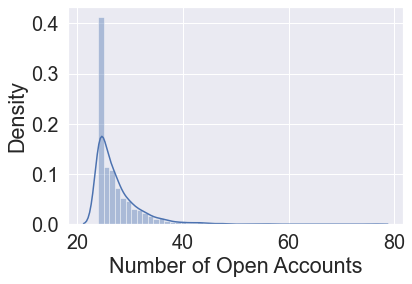

In [97]:
outlier_analysis('Number of Open Accounts')

### Number of Open Accounts vs. Loan Status

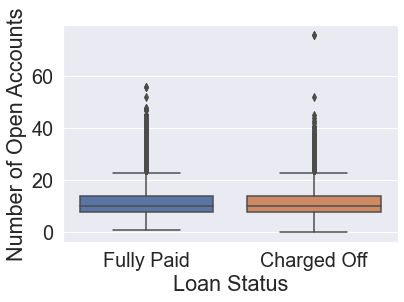

In [98]:
ax = sns.boxplot(x='Loan Status', y='Number of Open Accounts', data=df)

In [99]:
df.groupby(['Loan Status']).agg({'Number of Open Accounts':np.mean})

,Number of Open Accounts
Loan Status,
Charged Off,11.24
Fully Paid,11.08


### Number of Credit Problems

In [100]:
df['Number of Credit Problems'].describe()

count   99785.00
mean        0.17
std         0.48
min         0.00
25%         0.00
50%         0.00
75%         0.00
max        15.00
Name: Number of Credit Problems, dtype: float64

count   13648.00
mean        1.21
std         0.66
min         1.00
25%         1.00
50%         1.00
75%         1.00
max        15.00
Name: Number of Credit Problems, dtype: float64

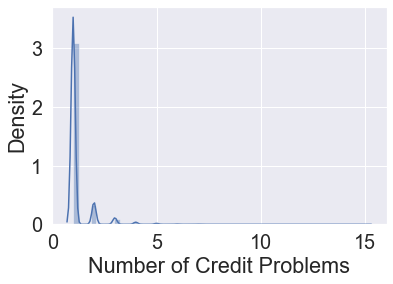

In [101]:
outlier_analysis("Number of Credit Problems")

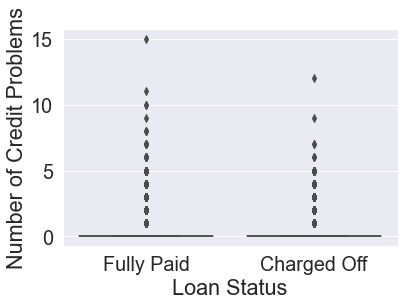

In [102]:
ax = sns.boxplot(x='Loan Status', y='Number of Credit Problems', data=df)

In [103]:
df.groupby(['Loan Status']).agg({'Number of Credit Problems':np.mean})

,Number of Credit Problems
Loan Status,
Charged Off,0.17
Fully Paid,0.16


### Current Credit Balance

In [104]:
df['Current Credit Balance'].describe()

count      99785.00
mean      293703.91
std       373855.19
min            0.00
25%       112423.00
50%       209551.00
75%       367061.00
max     32878968.00
Name: Current Credit Balance, dtype: float64

count       5177.00
mean     1305972.65
std      1043673.28
min       749037.00
25%       834214.00
50%       985720.00
75%      1364884.00
max     32878968.00
Name: Current Credit Balance, dtype: float64

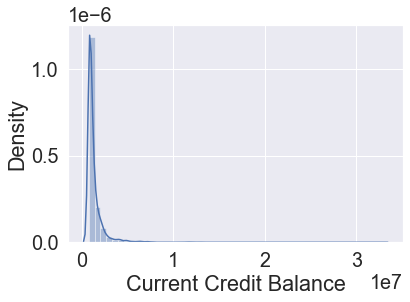

In [105]:
outlier_analysis('Current Credit Balance')

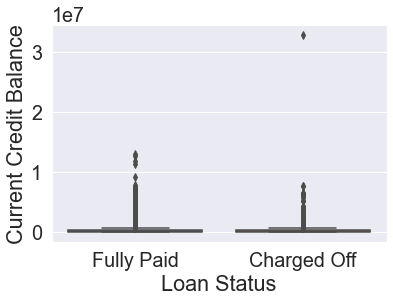

In [106]:
ax = sns.boxplot(x='Loan Status', y='Current Credit Balance', data=df)

#### There are a lot of noises and outliers here that I will fix them.

### Maximum Open Credit

In [107]:
df['Maximum Open Credit'].describe()

count        99783.00
mean        766784.68
std        8371541.25
min              0.00
25%         276441.00
50%         471702.00
75%         791142.00
max     1539737892.00
Name: Maximum Open Credit, dtype: float64

count         5757.00
mean       4741826.32
std       34587359.67
min        1563320.00
25%        1766688.00
50%        2112550.00
75%        2952840.00
max     1539737892.00
Name: Maximum Open Credit, dtype: float64

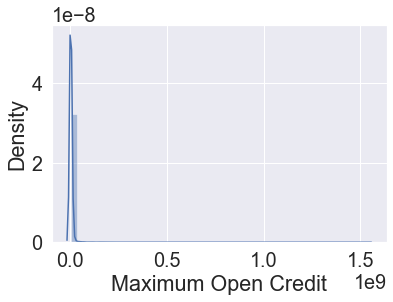

In [108]:
outlier_analysis('Maximum Open Credit')

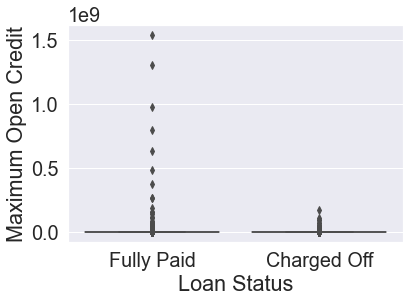

In [109]:
ax = sns.boxplot(x='Loan Status', y='Maximum Open Credit', data=df)

#### There are a lot of noises and outliers here that I will fix them.

### Bankruptcies

In [110]:
df['Bankruptcies'].describe()

count   99573.00
mean        0.12
std         0.35
min         0.00
25%         0.00
50%         0.00
75%         0.00
max         7.00
Name: Bankruptcies, dtype: float64

In [111]:
df['Bankruptcies'].value_counts()

0.00    88775
1.00    10255
2.00      415
3.00       96
4.00       24
5.00        6
7.00        1
6.00        1
Name: Bankruptcies, dtype: int64

<AxesSubplot:xlabel='Bankruptcies', ylabel='count'>

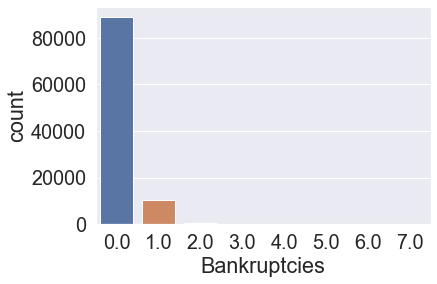

In [112]:
sns.countplot(df['Bankruptcies'])


In [113]:
contigency_table= pd.crosstab(df['Bankruptcies'],df['Loan Status'])
contigency_table

Loan Status,Charged Off,Fully Paid
Bankruptcies,,
0.00,20183,59697
1.00,2287,6946
2.00,92,277
3.00,18,64
4.00,7,17
5.00,2,3
6.00,0,1
7.00,0,1


In [114]:
chi_square('Bankruptcies','Loan Status')

[[2.01396207e+04 5.97403793e+04]
 [2.32785576e+03 6.90514424e+03]
 [9.30335510e+01 2.75966449e+02]
 [2.06741224e+01 6.13258776e+01]
 [6.05096267e+00 1.79490373e+01]
 [1.26061722e+00 3.73938278e+00]
 [2.52123444e-01 7.47876556e-01]
 [2.52123444e-01 7.47876556e-01]]

Chi-square is : 3.0146932553697265 

p_value is : 0.8836396646030097 

degree of freedom is :7

There is no correlation between the two variables


In [147]:
df2=df.copy()

In [148]:
df2['Bankruptcies'] = df2['Bankruptcies'].apply(lambda val: (">2") if (val>2) else val)

In [149]:
pd.crosstab(df2['Bankruptcies'],df2['Loan Status'])

Loan Status,Charged Off,Fully Paid
Bankruptcies,,
0.0,20183,59697
1.0,2287,6946
2.0,92,277
>2,27,86


In [150]:
chi_2, p_val, dof, exp_val = chi2_contingency(pd.crosstab(df2['Bankruptcies'],df2['Loan Status'],margins = False))# make sure margins = False

print(exp_val)
print(f'\nChi-square is : {chi_2}', f'\n\np_value is : {p_val}', f'\n\ndegree of freedom is :{dof}')

if p_val < 0.05:# consider significan level is 5%
    print("\nThere is some correlation between the two variables at 0.05 significant level")
else:
    print("\nThere is no correlation between the two variables")

[[2.01396207e+04 5.97403793e+04]
 [2.32785576e+03 6.90514424e+03]
 [9.30335510e+01 2.75966449e+02]
 [2.84899492e+01 8.45100508e+01]]

Chi-square is : 1.2032603248745823 

p_value is : 0.7522224577432777 

degree of freedom is :3

There is no correlation between the two variables


In [152]:
df2=df.copy()

In [153]:
df2['Bankruptcies'] = df2['Bankruptcies'].apply(lambda val: ("Bankruptcies") if (val>0) else "No Bankruptcy")
#I converted Missing Values to "No Bankruptcy" as well

In [154]:
pd.crosstab(df2['Bankruptcies'],df2['Loan Status'])

Loan Status,Charged Off,Fully Paid
Bankruptcies,,
Bankruptcies,2406,7309
No Bankruptcy,20233,59837


In [140]:
chi_2, p_val, dof, exp_val = chi2_contingency(pd.crosstab(df2['Bankruptcies'],df2['Loan Status'],margins = False))# make sure margins = False

print(exp_val)
print(f'\nChi-square is : {chi_2}', f'\n\np_value is : {p_val}', f'\n\ndegree of freedom is :{dof}')

if p_val < 0.05:# consider significan level is 5%
    print("\nThere is some correlation between the two variables at 0.05 significant level")
else:
    print("\nThere is no correlation between the two variables")

[[ 2449.60611461  7265.39388539]
 [20189.39388539 59880.60611461]]

Chi-square is : 1.137363011723822 

p_value is : 0.286210226723981 

degree of freedom is :1

There is no correlation between the two variables


### Tax Liens

In [119]:
df['Tax Liens'].describe()

count   99775.00
mean        0.03
std         0.26
min         0.00
25%         0.00
50%         0.00
75%         0.00
max        15.00
Name: Tax Liens, dtype: float64

In [120]:
df['Tax Liens'].value_counts()

0.00     97900
1.00      1305
2.00       354
3.00       113
4.00        60
5.00        17
6.00        10
7.00         6
9.00         5
8.00         2
15.00        1
11.00        1
10.00        1
Name: Tax Liens, dtype: int64

<AxesSubplot:xlabel='Tax Liens', ylabel='count'>

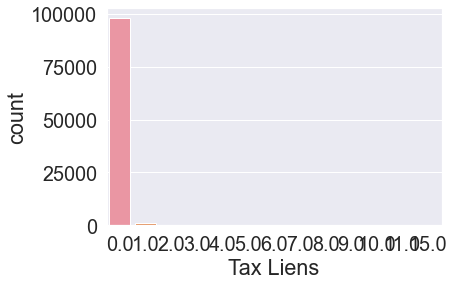

In [121]:
#countplot
sns.countplot(df['Tax Liens'])

In [122]:
df.groupby(['Loan Status']).agg({'Tax Liens':np.mean})

,Tax Liens
Loan Status,
Charged Off,0.03
Fully Paid,0.03


In [123]:
contigency_table= pd.crosstab(df['Tax Liens'],df['Loan Status'])
contigency_table

Loan Status,Charged Off,Fully Paid
Tax Liens,,
0.00,22150,65940
1.00,330,844
2.00,90,233
3.00,36,64
4.00,21,31
5.00,6,9
6.00,2,8
7.00,3,3
9.00,1,2


In [124]:
chi_square('Tax Liens','Loan Status')

[[2.22138379e+04 6.58761621e+04]
 [2.96050013e+02 8.77949987e+02]
 [8.14515795e+01 2.41548421e+02]
 [2.52172073e+01 7.47827927e+01]
 [1.31129478e+01 3.88870522e+01]
 [3.78258109e+00 1.12174189e+01]
 [2.52172073e+00 7.47827927e+00]
 [1.51303244e+00 4.48696756e+00]
 [7.56516218e-01 2.24348378e+00]
 [2.52172073e-01 7.47827927e-01]
 [2.52172073e-01 7.47827927e-01]
 [2.52172073e-01 7.47827927e-01]]

Chi-square is : 24.11312399155503 

p_value is : 0.01226461781500442 

degree of freedom is :11

There is some correlation between the two variables at 0.05 significant level


In [125]:
df2['Tax Liens'] = df2['Tax Liens'].apply(lambda val: (">4") if (val>4) else val)

In [126]:
pd.crosstab(df2['Tax Liens'],df2['Loan Status'])

Loan Status,Charged Off,Fully Paid
Tax Liens,,
0.0,22150,65940
1.0,330,844
2.0,90,233
3.0,36,64
4.0,21,31
>4,12,25


In [127]:
chi_2, p_val, dof, exp_val = chi2_contingency(pd.crosstab(df2['Tax Liens'],df2['Loan Status'],margins = False))# make sure margins = False

print(exp_val)
print(f'\nChi-square is : {chi_2}', f'\n\np_value is : {p_val}', f'\n\ndegree of freedom is :{dof}')

if p_val < 0.05:# consider significan level is 5%
    print("\nThere is some correlation between the two variables at 0.05 significant level")
else:
    print("\nThere is no correlation between the two variables")

[[2.22138379e+04 6.58761621e+04]
 [2.96050013e+02 8.77949987e+02]
 [8.14515795e+01 2.41548421e+02]
 [2.52172073e+01 7.47827927e+01]
 [1.31129478e+01 3.88870522e+01]
 [9.33036669e+00 2.76696333e+01]]

Chi-square is : 20.18144376200247 

p_value is : 0.0011554363809713833 

degree of freedom is :5

There is some correlation between the two variables at 0.05 significant level


# """Feature Engineering"""

### 1)Find and Replace

#### Current Loan Amount

#### For Credit Score:It looks like some of the credit score are just scaled up by 10, so I will fix it.

In [155]:
df['Credit Score'] = df['Credit Score'].apply(lambda val: (val /10) if (val>850 and val%10==0) else val)
#  you can remove this part:and val%10==0 because we checked before

In [156]:
df['Credit Score'].describe()

count   78650.00
mean      718.38
std        28.14
min       585.00
25%       706.00
50%       725.00
75%       740.00
max       751.00
Name: Credit Score, dtype: float64

<AxesSubplot:xlabel='Credit Score', ylabel='Density'>

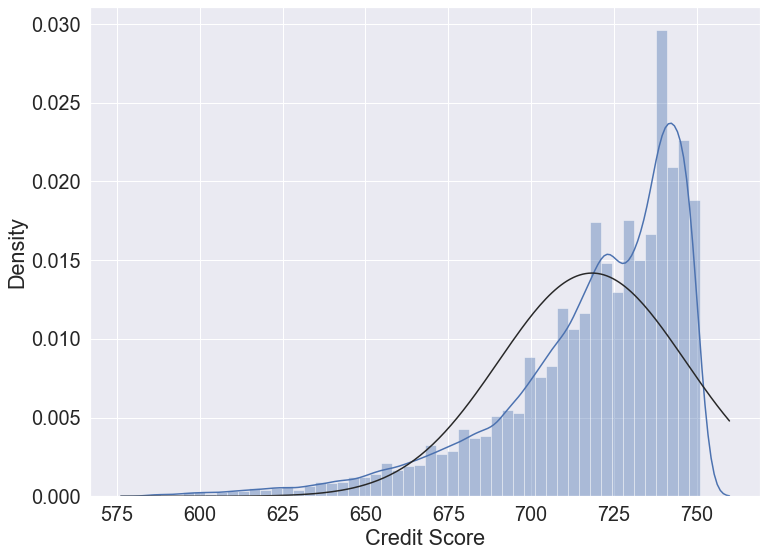

In [159]:
## from scipy.stats import norm
plt.figure(figsize=(12,9))
sns.distplot(df['Credit Score'], fit= norm)

In [158]:
#skewness and kurtosis
print("Skewness: %f" % df['Credit Score'].skew())
print("Kurtosis: %f" % df['Credit Score'].kurt())

Skewness: -1.440363
Kurtosis: 2.270842


## Credit Score Vs. Loan Status

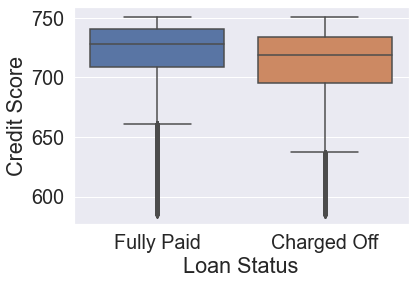

In [160]:
ax = sns.boxplot(x='Loan Status', y='Credit Score', data=df)

In [161]:
df.groupby(['Loan Status']).agg({'Credit Score':np.mean})

,Credit Score
Loan Status,
Charged Off,710.39
Fully Paid,721.22


## T-Test

Text(0.5, 1.0, 'Independent Sample T-Test')

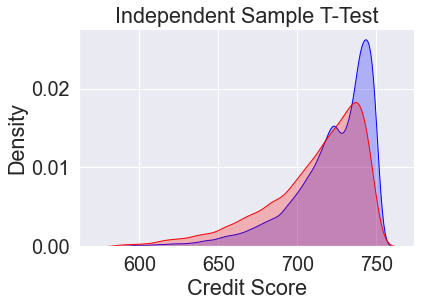

In [163]:
sns.kdeplot(Good['Credit Score'], shade=True,color='blue')
sns.kdeplot(Bad['Credit Score'], shade=True,color='red')
plt.title("Independent Sample T-Test")

In [164]:
Good=Good.drop(Good[Good['Credit Score'].isnull()].index)
Bad=Bad.drop(Bad[Bad['Credit Score'].isnull()].index)
a=Good['Credit Score']
b=Bad['Credit Score']

In [165]:
from scipy import stats
tStat, pValue = stats.ttest_ind(a, b, equal_var = False) #run independent sample T-Test
print("P-Value:{0} T-Statistic:{1}".format(pValue,tStat))#print the P-Value and the T-Statistic

P-Value:0.0 T-Statistic:40.94095132339562


In [166]:
stats.levene(a, b)

LeveneResult(statistic=565.1886575794314, pvalue=1.9324070408222864e-124)

### Term Vs. Credit Score Vs. Loan status

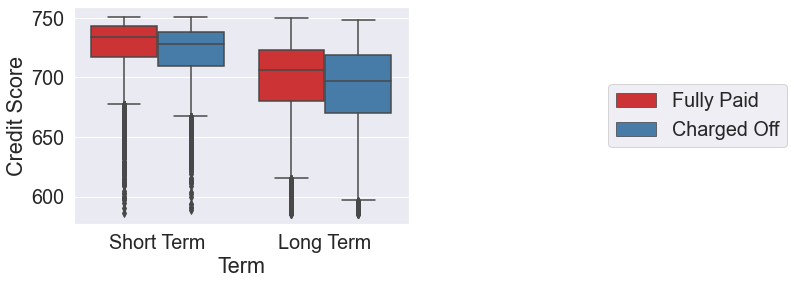

In [167]:
 ax = sns.boxplot(x="Term", y="Credit Score", hue="Loan Status",
               data=df, palette="Set1")
ax.legend(loc=6,borderaxespad=27)

In [168]:
df.groupby(['Loan Status',"Term"]).agg({'Credit Score':np.mean})

Credit Score
Loan Status Term                    
Charged Off Long Term         691.39
            Short Term        721.69
Fully Paid  Long Term         699.23
            Short Term        728.04

### Home Ownership

In [169]:
df['Home Ownership'].value_counts()

Home Mortgage    48415
Rent             42058
Own Home          9113
HaveMortgage       199
Name: Home Ownership, dtype: int64

In [170]:
df['Home Ownership']=df['Home Ownership'].replace('HaveMortgage', 'Home Mortgage')

In [171]:
df['Home Ownership'].value_counts()

Home Mortgage    48614
Rent             42058
Own Home          9113
Name: Home Ownership, dtype: int64

## Home Ownership Vs. Loan Status

In [172]:
df.groupby(['Home Ownership','Loan Status']).agg({'Loan Status':np.size})

Loan Status
Home Ownership Loan Status             
Home Mortgage  Charged Off         9941
               Fully Paid         33790
Own Home       Charged Off         2102
               Fully Paid          6097
Rent           Charged Off        10596
               Fully Paid         27259

In [176]:
#or
contigency_table= pd.crosstab(df['Home Ownership'],df['Loan Status'])
contigency_table

Loan Status,Charged Off,Fully Paid
Home Ownership,,
Home Mortgage,9941,33790
Own Home,2102,6097
Rent,10596,27259


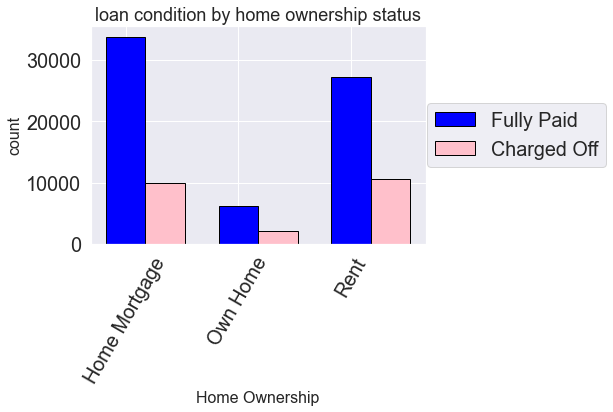

In [177]:
home_ownership=[ 'Home Mortgage','Own Home','Rent']
loan_condition=['Fully Paid','Charged Off']
pos = np.arange(len(home_ownership))
bar_width = 0.35
Index_good=[contigency_table.iloc[0,1],contigency_table.iloc[1,1],contigency_table.iloc[2,1]]
Index_bad=[contigency_table.iloc[0,0],contigency_table.iloc[1,0],contigency_table.iloc[2,0]]
 
plt.bar(pos,Index_good,bar_width,color='blue',edgecolor='black')
plt.bar(pos+bar_width,Index_bad,bar_width,color='pink',edgecolor='black')
plt.xticks(pos, home_ownership)
plt.xlabel('Home Ownership', fontsize=16)
plt.ylabel('count', fontsize=16)
plt.title('loan condition by home ownership status',fontsize=18)
plt.legend(loan_condition,loc=6,borderaxespad=17)
plt.xticks(rotation=60)
plt.show()

In [174]:
chi_square('Home Ownership','Loan Status')

[[11026.63149747 32704.36850253]
 [ 2067.3515732   6131.6484268 ]
 [ 9545.01692933 28309.98307067]]

Chi-square is : 298.4391499645383 

p_value is : 1.5658926775157026e-65 

degree of freedom is :2

There is some correlation between the two variables at 0.05 significant level


### 'Home Ownership' Vs.'Purpose'

In [178]:
pd.crosstab(df['Home Ownership'],df['Purpose'])

Purpose,Business Loan,Buy House,Buy a Car,Debt Consolidation,Educational Expenses,Home Improvements,Medical Bills,major_purchase,moving,other,small_business,vacation,wedding
Home Ownership,,,,,,,,,,,,,
Home Mortgage,743,228,517,38019,28,4574,492,155,25,3461,127,217,28
Own Home,131,71,160,6866,9,781,117,51,3,843,21,51,9
Rent,655,353,630,33827,68,475,487,176,121,4691,138,359,78


In [179]:
chi_square('Home Ownership','Purpose')

[[7.44909616e+02 3.17646219e+02 6.36754001e+02 3.83474988e+04
  5.11546826e+01 2.84030285e+03 5.33957449e+02 1.86105607e+02
  7.25909305e+01 4.38225114e+03 1.39335612e+02 3.05466533e+02
  5.60265571e+01]
 [1.39637992e+02 5.95447813e+01 1.19363542e+02 7.18847979e+03
  9.58926692e+00 5.32432630e+02 1.00093681e+02 3.48866663e+01
  1.36076264e+01 8.21480533e+02 2.61193366e+01 5.72616225e+01
  1.05025304e+01]
 [6.44452393e+02 2.74808999e+02 5.50882457e+02 3.31760214e+04
  4.42560505e+01 2.45726452e+03 4.61948870e+02 1.61007727e+02
  6.28014431e+01 3.79126833e+03 1.20545052e+02 2.64271844e+02
  4.84709125e+01]]

Chi-square is : 3544.668180067324 

p_value is : 0.0 

degree of freedom is :24

There is some correlation between the two variables at 0.05 significant level
